In [1]:
!pip install mtcnn
from mtcnn import MTCNN
import cv2

/bin/bash: /home/pushpesh/miniconda3/envs/tf/lib/libtinfo.so.6: no version information available (required by /bin/bash)


2022-10-07 14:40:47.169132: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-07 14:40:47.607043: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-07 14:40:48.529076: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/pushpesh/miniconda3/envs/tf/lib/python3.9/site-packages/cv2/../../../../lib::/home/pushpesh/miniconda3/envs/tf/lib/
2022-10-07 14:40:48.529198: W tensorflow/stream_executor/platform/default/dso_loader.cc:64

In [7]:
image_path = r"/home/pushpesh/Videos/proj/img/test2.jpg"
img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
detector = MTCNN()
detections = detector.detect_faces(img)

5/5 [==============================] - 0s 25ms/step


(-0.5, 2047.5, 1364.5, -0.5)

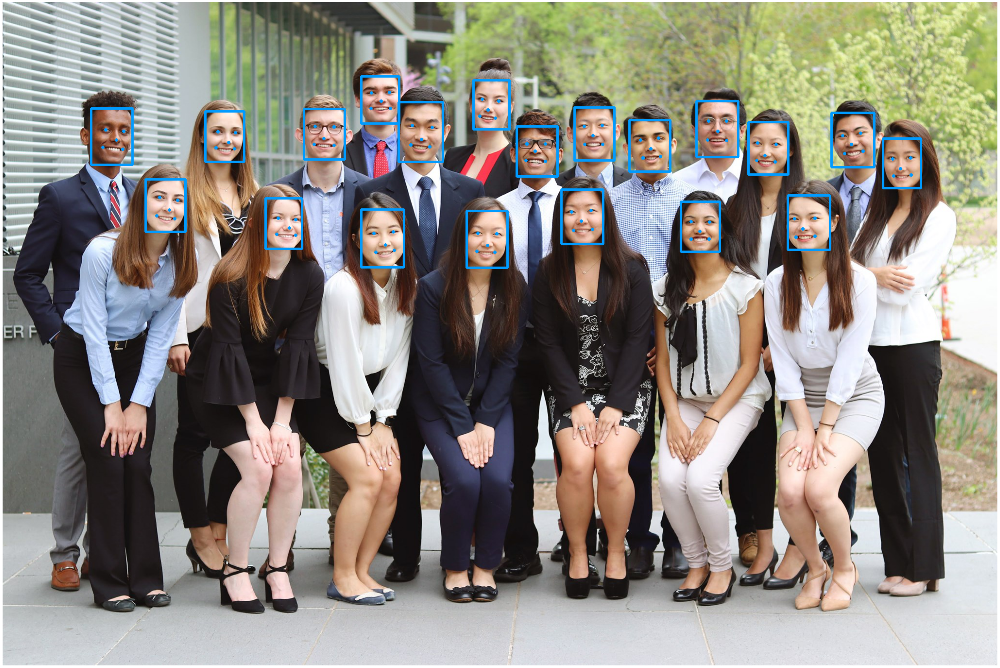

In [8]:
import matplotlib.pyplot as plt

img_with_dets = img.copy()
min_conf = 0.9
for det in detections:
    if det['confidence'] >= min_conf:
        x, y, width, height = det['box']
        keypoints = det['keypoints']
        cv2.rectangle(img_with_dets, (x,y), (x+width,y+height), (0,155,255), 3)
        cv2.circle(img_with_dets, (keypoints['left_eye']), 2, (0,155,255), 2)
        cv2.circle(img_with_dets, (keypoints['right_eye']), 2, (0,155,255), 2)
        cv2.circle(img_with_dets, (keypoints['nose']), 2, (0,155,255), 2)
        cv2.circle(img_with_dets, (keypoints['mouth_left']), 2, (0,155,255), 2)
        cv2.circle(img_with_dets, (keypoints['mouth_right']), 2, (0,155,255), 2)
plt.figure(figsize = (50,50))
plt.imshow(img_with_dets)
plt.axis('off')